In [366]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import cv2
import sys 
sys.path.insert(0, '/scratch/vivianep/event_based_gaze_tracking/visualize.py')
import visualize
import scipy
import random
import math
from scipy import stats

In [367]:
import importlib
importlib.reload(visualize)

<module 'visualize' from '/scratch/vivianep/event_based_gaze_tracking/visualize.py'>

In [368]:
user_id = 13
experiment_id = 0 # 0: left eye, 1: right eye

# Load data
eye_dataset = visualize.EyeDataset(os.path.join(os.getcwd(), 'eye_data'), user_id)
eye_dataset.collect_data(experiment_id)

Loading Frames....
There are 7664 frames 

Loading Events....
There are 88818552 events 



In [369]:
# access the frame stack of eye_dataset
frame_stack = eye_dataset.frame_stack
# access the event stack of eye_dataset
event_stack = eye_dataset.event_stack

In [370]:
frame_rate = 25

frame_df = pd.DataFrame(frame_stack, columns=['row', 'col', 'img_path', 'timestamp'])
frame_df['frame_number'] = frame_df['timestamp'].apply(lambda x: int(x / (1000000 / frame_rate)))

event_stack = np.array(event_stack).reshape(-1, 4)
timestamps = event_stack[:, 0]
x = event_stack[:, 1]
y = event_stack[:, 2]
polarity = event_stack[:, 3]

event_df = pd.DataFrame({'timestamp': timestamps, 'x': x, 'y': y, 'polarity': polarity})
event_df['frame_number'] = event_df['timestamp'].apply(lambda x: int(x / (1000000 / frame_rate)))

In [371]:
def pupil_detection_refinement(frame_path: str, plot: bool, best: bool, debug: bool):
    """
    Refines the pupil detection by applying edge detection and ellipse fitting to the image.

    Parameters
    ----------
    frame_path : str
        Path to the frame image
    plot : bool
        If True, plots the image with the detected ellipses
    best : bool
        If True, returns the ellipse that fits the pupil best
    debug : bool
        If True, prints debug statements

    Returns
    -------
    ellipse : tuple
        The ellipse that fits the pupil best
    """

    if debug:
        print("Starting pupil detection refinement")
    ellipse = None
    ellipses = []

    rgb_img = cv2.imread(frame_path)
    frame_height = rgb_img.shape[0]
    frame_width = rgb_img.shape[1]

    # Convert to grayscale
    gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

    # Apply histogram equalization to grayscale image
    clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(8, 8))
    gray_img = clahe.apply(gray_img)

    if plot:
        plt.imshow(gray_img, cmap='gray')
        plt.title("New High-contrast grayscale image")
        plt.show()

    blurred = cv2.GaussianBlur(gray_img, (3, 3), 0)
    blurred = cv2.medianBlur(blurred, 5)
    # blurred = np.uint8(blurred)
    # blurred = cv2.normalize(blurred, blurred, 0, 255, cv2.NORM_MINMAX)
    # blurred = cv2.equalizeHist(blurred)
    # blurred = cv2.fastNlMeansDenoising(blurred, None, 10, 7, 21)

    edges = cv2.Canny(blurred, 20, 60)

    # connect broken edges
    kernel = np.ones((5, 5), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    edges = cv2.erode(edges, kernel, iterations=1)

    # smooth out gaps in edges
    kernel = np.ones((5, 5), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    if plot:
        plt.imshow(edges, cmap='gray')
        plt.title("Refined Edge detection")
        plt.show()

    # Find contours
    contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

    if plot:
        # plot the image with all contours
        rgb_img = cv2.drawContours(rgb_img, contours, -1, (0, 255, 0), 3)
        plt.imshow(rgb_img)
        plt.title("All contours found after refinement")
        plt.show()

    # Fit ellipse to each contour
    for contour in contours:
        ellipse = cv2.fitEllipse(contour)
        ellipses.append(ellipse)

    if plot:
        for ellipse in ellipses:
            rgb_img = cv2.ellipse(rgb_img, ellipse, (0, 0, 255), 2)
        plt.imshow(rgb_img)
        plt.title("All ellipses found after refinement")
        plt.show()

    # count None values
    none_count = 0
    for ellipse in ellipses:
        if ellipse is None:
            none_count += 1

    num_ellipses = len(ellipses) - none_count

    if debug:
        print("Number of ellipses found after refinement: {}".format(num_ellipses))

    if plot:
        circle_colors = []
        pixel_vals = []
        for ellipse in ellipses:
            if ellipse is not None:
                # check if the pixel value is inside the image
                x_coord = int(ellipse[0][0]) - 1
                y_coord = int(ellipse[0][1]) - 1
                x_range = range(0, frame_width)
                y_range = range(0, frame_height)
                if debug:
                    print("[x, y] = [{}, {}]".format(x_coord, y_coord))
                    print("x_range: ", x_range)
                    print("y_range: ", y_range)
                if x_coord not in x_range or y_coord not in y_range:
                    ellipse = None
                else: 
                    pixel_value = gray_img[int(ellipse[0][1]) - 1, int(ellipse[0][0]) - 1]
                    pixel_vals.append(pixel_value)
                    if debug:
                        print("Ellipse center x coordinate: ", x_coord)
                        print("Ellipse center y coordinate: ", y_coord)
                    cv2.ellipse(rgb_img, ellipse, (255, 255, 0), 2)
                    r = random.randint(0, 255)
                    g = random.randint(0, 255)
                    b = random.randint(0, 255)
                    circle_colors.append((r, g, b))
                    cv2.circle(rgb_img, (int(ellipse[0][0]), int(ellipse[0][1])), 2, (r, g, b), 3)
        # create a legend for the circles with the circle colors
        patches = []
        for color, px in zip(circle_colors, pixel_vals):
            # scale color values to [0, 1] range for matplotlib
            color = (color[0] / 255, color[1] / 255, color[2] / 255)
            patches.append(mpatches.Patch(color=color, label=str(px)))
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        plt.imshow(rgb_img)
        plt.title("All ellipses after refinement with center points")
        plt.show()

    # replace ellipses with None if the pixel value is too high
    for i, ellipse in enumerate(ellipses):
        if ellipse is not None:
            # check if the pixel value is inside the image
            x_coord = int(ellipse[0][0]) - 1
            y_coord = int(ellipse[0][1]) - 1
            x_range = range(0, frame_width)
            y_range = range(0, frame_height)
            if debug:
                print("[x, y] = [{}, {}]".format(x_coord, y_coord))
                print("x_range: ", x_range)
                print("y_range: ", y_range)
            if x_coord not in x_range or y_coord not in y_range:
                ellipses[i] = None
            else: 
                pixel_value = gray_img[int(ellipse[0][1]) - 1, int(ellipse[0][0]) - 1]
                if pixel_value > 20:
                    ellipses[i] = None

    # count None values
    none_count = 0
    for ellipse in ellipses:
        if ellipse is None:
            none_count += 1

    remaining_ellipses = len(ellipses) - none_count

    if debug:
        print("Number of ellipses after refinement with pixel value > 20: {}".format(remaining_ellipses))

    if plot and remaining_ellipses > 0:
        rgb_img = cv2.imread(frame_path)
        # show the remaining ellipses
        for ellipse in ellipses:
            if ellipse is not None:
                cv2.ellipse(rgb_img, ellipse, (0, 0, 255), 2)
        plt.imshow(rgb_img)
        plt.title("Ellipses after refinement with pixel value > 20")
        plt.show()

    # drop all ellipses with None values
    ellipses = [ellipse for ellipse in ellipses if ellipse is not None]

    if remaining_ellipses > 1:
        # pick the ellipse with the smallest area
        areas = []
        for ellipse in ellipses:
            areas.append(ellipse[1][0] * ellipse[1][1] * math.pi)
        min_area = min(areas)
        min_area_index = areas.index(min_area)
        ellipse = ellipses[min_area_index]
        if debug:
            print("Ellipse with smallest area: {}".format(ellipse))
            print("Area: {}".format(min_area))
            print("Center: {}".format(ellipse[0]))

    elif remaining_ellipses == 1:
        # pick the only ellipse
        ellipse = ellipses[0]
        if debug:
            print("Ellipse with smallest area: {}".format(ellipse))
            print("Area: {}".format(ellipse[1][0] * ellipse[1][1] * math.pi))
            print("Center: {}".format(ellipse[0]))

    if best:
        # plot the image with the best ellipse
        rgb_img = cv2.imread(frame_path)
        cv2.ellipse(rgb_img, ellipse, (255, 0, 0), 2)
        plt.imshow(rgb_img)
        plt.title("Best ellipse found after refinement")
        plt.show()

    return ellipse


    

def pupil_detection(frame_path: str, plot: bool, best: bool, debug: bool):
    """
    Detects the pupil in a given frame.

    Parameters
    ----------
    frame_path : str
        Path to the frame to be processed.
    plot : bool
        If True, the results of the pupil detection will be plotted.
    best : bool
        If True, the best ellipse will be plotted.
    debug : bool
        If True, debug information will be printed.

    Returns
    -------
    ellipse : tuple
        The ellipse that best fits the pupil.
    """
    
    ellipse = None
    ellipses = []

    # Load image
    rgb_img = cv2.imread(frame_path)
    frame_height = rgb_img.shape[0] # y axis
    frame_width = rgb_img.shape[1] # x axis

    # Convert to grayscale
    gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

    # Apply histogram equalization to grayscale image
    clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(8, 8))
    gray_img = clahe.apply(gray_img)

    if plot:
        plt.imshow(gray_img, cmap='gray')
        plt.title("High-contrast grayscale image")
        plt.show()

    # Apply NLM denoising
    gray_img = cv2.fastNlMeansDenoising(gray_img, None, 10, 7, 21)

    # Perform edge detection
    edges = cv2.Canny(gray_img, 20, 90)

    # connect broken edges
    kernel = np.ones((3, 3), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    edges = cv2.erode(edges, kernel, iterations=1)

    # smooth out gaps in edges
    kernel = np.ones((5, 5), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    if plot:
        plt.imshow(edges, cmap='gray')
        plt.title("Edge detection")
        plt.show()

    # Find contours
    contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

    if plot:
        # plot the image with all contours
        rgb_img = cv2.drawContours(rgb_img, contours, -1, (0, 255, 0), 3)
        plt.imshow(rgb_img)
        plt.title("All contours found")
        plt.show()


    for contour in contours:
        try: 
            ellipse = cv2.fitEllipse(contour)
            cv2.ellipse(rgb_img, ellipse, (255, 255, 0), 2)
            ellipses.append(ellipse)
        except:
            ellipses.append(None)
            if debug:
                print("Ellipse fitting failed")

    if plot:
        plt.imshow(rgb_img)
        plt.title("All ellipses after contour fitting")
        plt.show()

    # count None values
    none_count = 0
    for ellipse in ellipses:
        if ellipse is None:
            none_count += 1

    num_ellipses = len(ellipses) - none_count

    if debug:
        print("Number of ellipses found: {}".format(num_ellipses))

    if plot:
        circle_colors = []
        pixel_vals = []
        for ellipse in ellipses:
            if ellipse is not None:
                # check if the pixel value is inside the image
                x_coord = int(ellipse[0][0]) - 1
                y_coord = int(ellipse[0][1]) - 1
                x_range = range(0, frame_width)
                y_range = range(0, frame_height)
                if debug:
                    print("[x, y] = [{}, {}]".format(x_coord, y_coord))
                    print("x_range: ", x_range)
                    print("y_range: ", y_range)
                if x_coord not in x_range or y_coord not in y_range:
                    ellipse = None
                else: 
                    pixel_value = gray_img[int(ellipse[0][1]) - 1, int(ellipse[0][0]) - 1]
                    pixel_vals.append(pixel_value)
                    if debug:
                        print("Ellipse center x coordinate: ", x_coord)
                        print("Ellipse center y coordinate: ", y_coord)
                    cv2.ellipse(rgb_img, ellipse, (255, 255, 0), 2)
                    r = random.randint(0, 255)
                    g = random.randint(0, 255)
                    b = random.randint(0, 255)
                    circle_colors.append((r, g, b))
                    cv2.circle(rgb_img, (int(ellipse[0][0]), int(ellipse[0][1])), 2, (r, g, b), 3)
        # create a legend for the circles with the circle colors
        patches = []
        for color, px in zip(circle_colors, pixel_vals):
            # scale color values to [0, 1] range for matplotlib
            color = (color[0] / 255, color[1] / 255, color[2] / 255)
            patches.append(mpatches.Patch(color=color, label=str(px)))
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        plt.imshow(rgb_img)
        plt.title("All ellipses with center points")
        plt.show()

    # replace ellipses with None if the pixel value is too high
    for i, ellipse in enumerate(ellipses):
        if ellipse is not None:
            # check if the pixel value is inside the image
            x_coord = int(ellipse[0][0]) - 1
            y_coord = int(ellipse[0][1]) - 1
            x_range = range(0, frame_width)
            y_range = range(0, frame_height)
            if debug:
                print("[x, y]: [{}, {}]".format(x_coord, y_coord))
                print("x_range: ", x_range)
                print("y_range: ", y_range)
            if x_coord not in x_range or y_coord not in y_range:
                ellipses[i] = None
            else: 
                pixel_value = gray_img[int(ellipse[0][1]) - 1, int(ellipse[0][0]) - 1]
                if pixel_value > 20:
                    ellipses[i] = None

    # count None values
    none_count = 0
    for ellipse in ellipses:
        if ellipse is None:
            none_count += 1

    remaining_ellipses = len(ellipses) - none_count

    if debug:
        print("Number of ellipses with pixel value > 20: {}".format(remaining_ellipses))

    if plot and remaining_ellipses > 0:
        rgb_img = cv2.imread(frame_path)
        # show the remaining ellipses
        for ellipse in ellipses:
            if ellipse is not None:
                cv2.ellipse(rgb_img, ellipse, (255, 0, 255), 2)
        plt.imshow(rgb_img)
        plt.title("Ellipses with pixel value > 20")
        plt.show()

    # drop all ellipses with None values
    ellipses = [ellipse for ellipse in ellipses if ellipse is not None]

    if remaining_ellipses == 0:
        if debug:
            print("Refinement needed... ")
        ellipse = pupil_detection_refinement(frame_path, plot=plot, best=best, debug=debug)


    elif remaining_ellipses > 1:
        # pick the ellipse with the smallest area
        areas = []
        for ellipse in ellipses:
            areas.append(ellipse[1][0] * ellipse[1][1] * math.pi)
        min_area = min(areas)
        min_area_index = areas.index(min_area)
        ellipse = ellipses[min_area_index]
        if debug:
            print("Ellipse with smallest area: {}".format(ellipse))
            print("Area: {}".format(min_area))
            print("Center: {}".format(ellipse[0]))

    elif remaining_ellipses == 1:
        # pick the only ellipse
        ellipse = ellipses[0]
        if debug:
            print("Ellipse with smallest area: {}".format(ellipse))
            print("Area: {}".format(ellipse[1][0] * ellipse[1][1] * math.pi))
            print("Center: {}".format(ellipse[0]))

    if best and remaining_ellipses >= 1:
        # plot the image with the best ellipse
        rgb_img = cv2.imread(frame_path)
        cv2.ellipse(rgb_img, ellipse, (255, 0, 0), 2)
        plt.imshow(rgb_img)
        plt.title("Best ellipse found")
        plt.show()

    return ellipse

def pupil_postprocessing(frame_df: pd.DataFrame) -> pd.DataFrame:
    """
    Postprocess the pupil detection results by removing outliers and smoothing the pupil center coordinates.

    Parameters
    ----------
    frame_df : pd.DataFrame
        DataFrame containing the pupil center coordinates for each frame

    Returns
    -------
    pd.DataFrame
        DataFrame containing the postprocessed pupil center coordinates for each frame
    """
    # interpolate missing values in the pupil column
    print("Interpolating {} missing values in the pupil column...".format(frame_df["pupil"].isna().sum()))
    
    x_coords = frame_df['pupil'].apply(lambda coord: coord[0] if coord is not None else None).values
    y_coords = frame_df['pupil'].apply(lambda coord: coord[1] if coord is not None else None).values

    # interpolate missing values in the x and y coordinates
    x_coords = pd.Series(x_coords).interpolate(method='spline', order=3).values
    y_coords = pd.Series(y_coords).interpolate(method='spline', order=3).values

    # replace the pupil column with the interpolated values
    frame_df['pupil'] = list(zip(x_coords, y_coords))



    print("There are {} missing values in the pupil column after interpolation.".format(frame_df["pupil"].isna().sum()))

    # remove outliers using z-score in the pupil column
    threshold = 3
    
    # calculate z-score for each pupil coordinate
    z_score_x = np.abs(stats.zscore(frame_df['pupil'].apply(lambda coord: coord[0] if coord is not None else None).values))
    z_score_y = np.abs(stats.zscore(frame_df['pupil'].apply(lambda coord: coord[1] if coord is not None else None).values))

    print("Removing {} outliers in the pupil column...".format(len(np.where(z_score_x > threshold)[0]) + len(np.where(z_score_y > threshold)[0])))

    # remove outliers
    pupil_x = frame_df['pupil'].apply(lambda coord: coord[0] if coord is not None else None).values
    pupil_y = frame_df['pupil'].apply(lambda coord: coord[1] if coord is not None else None).values

    # replace outliers with None
    pupil_x[np.where(z_score_x > threshold)] = None
    pupil_y[np.where(z_score_y > threshold)] = None

    # replace the pupil column with the outlier-free values
    frame_df['pupil'] = list(zip(pupil_x, pupil_y))

    # apply interpolation again to fill the missing values
    x_coords = frame_df['pupil'].apply(lambda coord: coord[0] if coord is not None else None).values
    y_coords = frame_df['pupil'].apply(lambda coord: coord[1] if coord is not None else None).values

    # interpolate missing values in the x and y coordinates
    x_coords = pd.Series(x_coords).interpolate(method='spline', order=3).values
    y_coords = pd.Series(y_coords).interpolate(method='spline', order=3).values

    # replace the pupil column with the interpolated values
    frame_df['pupil'] = list(zip(x_coords, y_coords))


    return frame_df


In [372]:
rgb_img = cv2.imread(frame_df['img_path'][0])
frame_height = rgb_img.shape[0]
frame_width = rgb_img.shape[1]
print("Frame height: {}".format(frame_height))
print("Frame width: {}".format(frame_width))

Frame height: 260
Frame width: 346


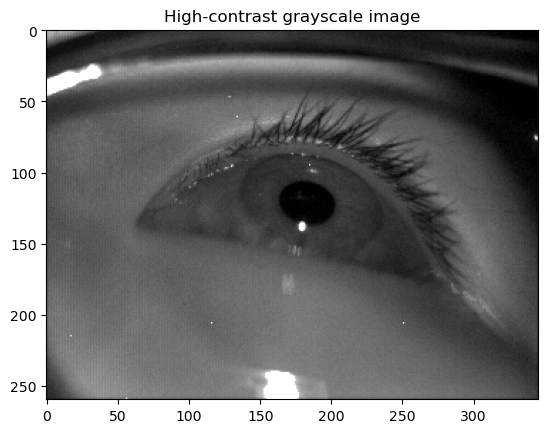

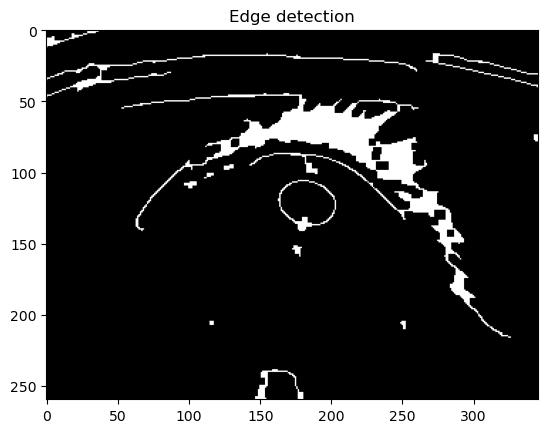

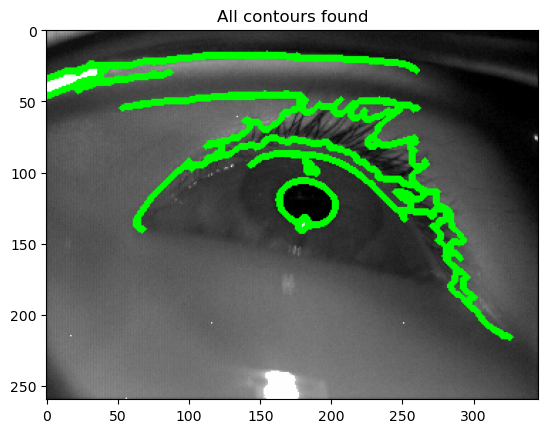

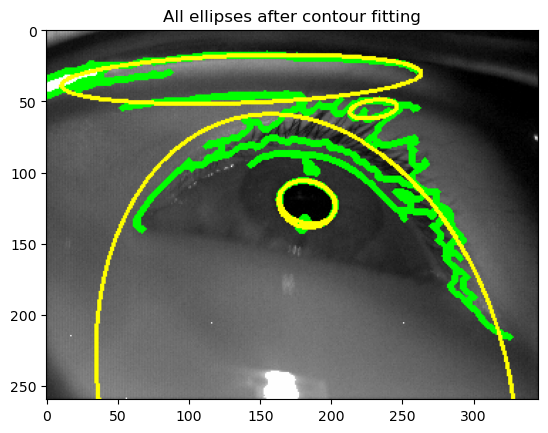

Number of ellipses found: 5
[x, y] = [181, 260]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [181, 121]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  181
Ellipse center y coordinate:  121
[x, y] = [182, 120]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  182
Ellipse center y coordinate:  120
[x, y] = [228, 54]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  228
Ellipse center y coordinate:  54
[x, y] = [135, 33]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  135
Ellipse center y coordinate:  33


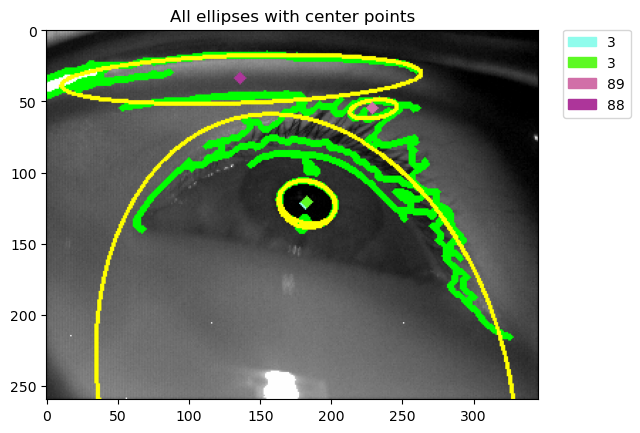

[x, y]: [181, 260]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [181, 121]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [182, 120]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [228, 54]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [135, 33]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 2


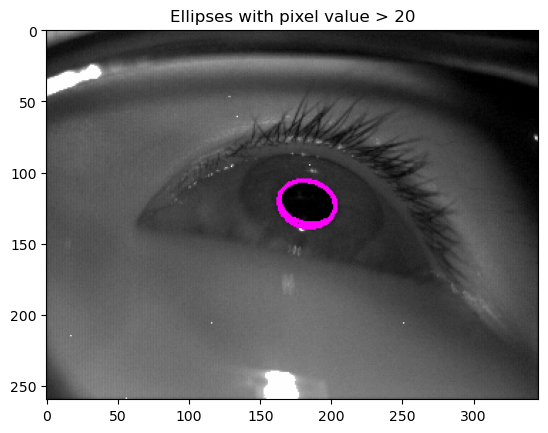

Ellipse with smallest area: ((183.40933227539062, 121.25567626953125), (29.10665512084961, 40.49449920654297), 104.86320495605469)
Area: 3702.867783427285
Center: (183.40933227539062, 121.25567626953125)


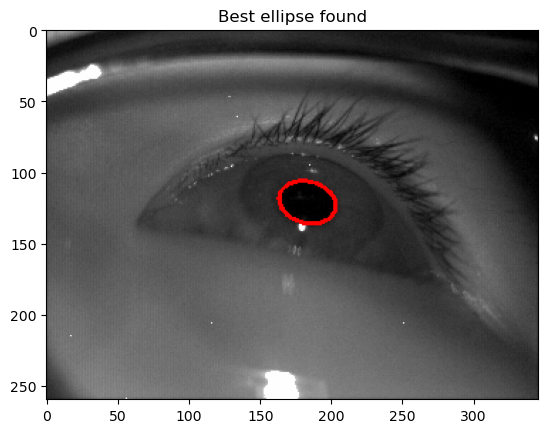

In [356]:
frame = '/scratch/vivianep/event_based_gaze_tracking/eye_data/user4/0/frames/3027_384_1446_s_385182871.png'#frame_df['img_path'][0]
pupil = pupil_detection(frame, plot=True, best=True, debug=True)

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/4583_930_1284_s_527106585.png


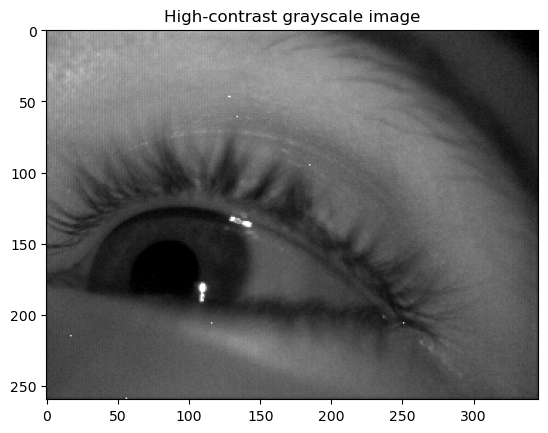

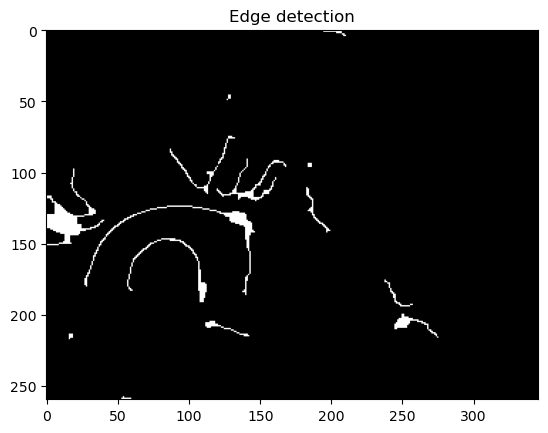

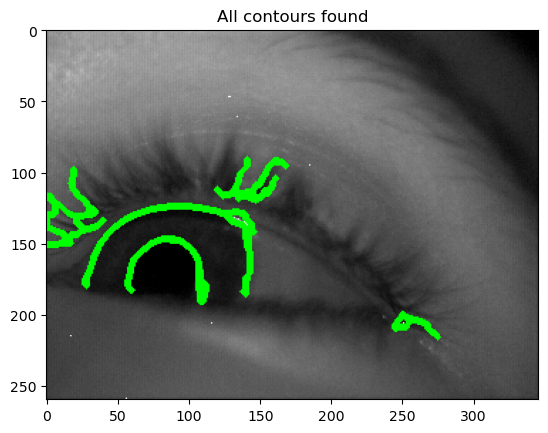

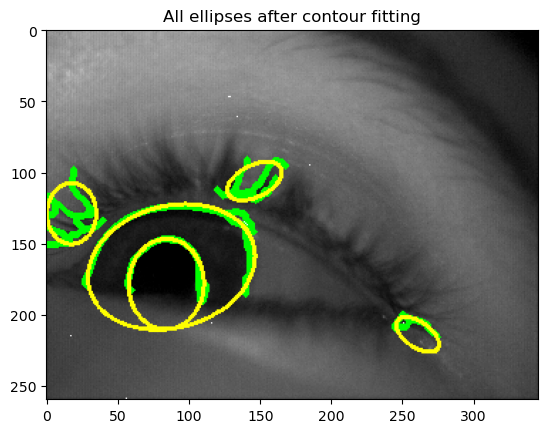

Number of ellipses found: 5
[x, y] = [16, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  16
Ellipse center y coordinate:  128
[x, y] = [86, 165]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  86
Ellipse center y coordinate:  165
[x, y] = [83, 177]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  83
Ellipse center y coordinate:  177
[x, y] = [145, 105]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  145
Ellipse center y coordinate:  105
[x, y] = [259, 213]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  259
Ellipse center y coordinate:  213


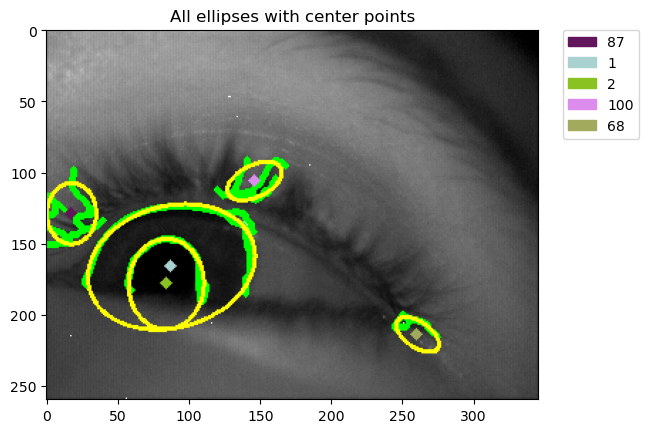

[x, y]: [16, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [86, 165]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [83, 177]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [145, 105]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [259, 213]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 2


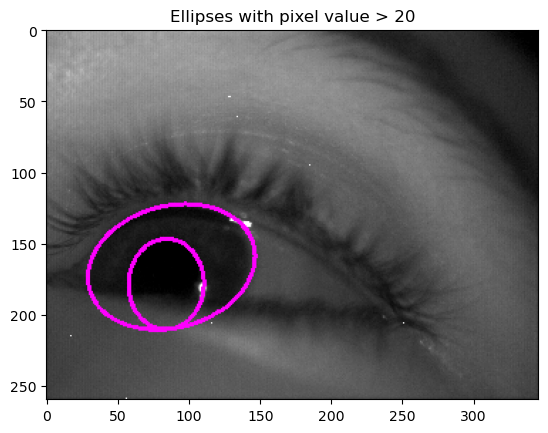

Ellipse with smallest area: ((84.09150695800781, 178.70693969726562), (52.99410629272461, 63.36365509033203), 1.5081804990768433)
Area: 10549.154828995039
Center: (84.09150695800781, 178.70693969726562)


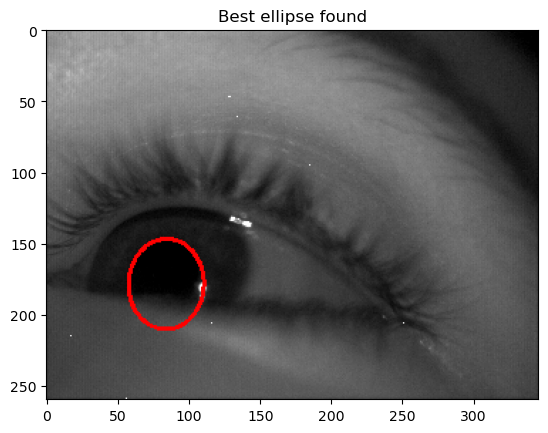

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/5469_150_788_p_562546211.png


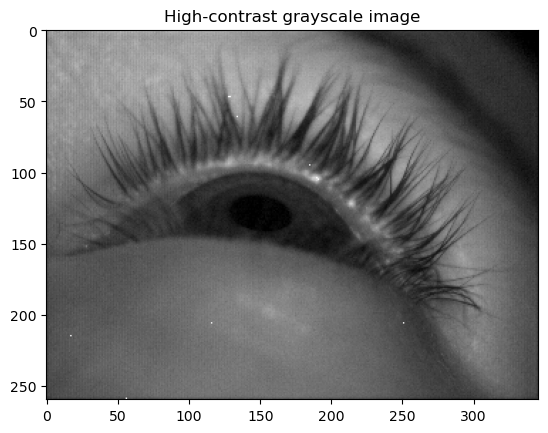

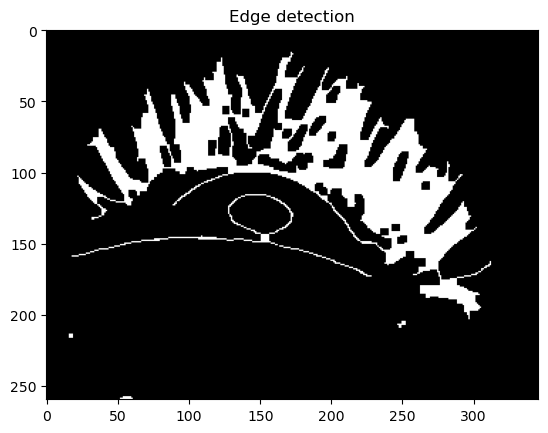

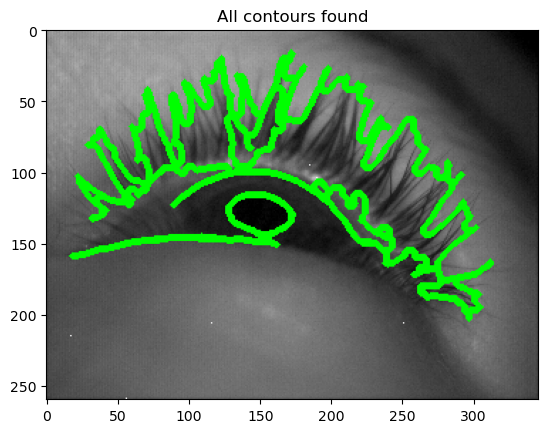

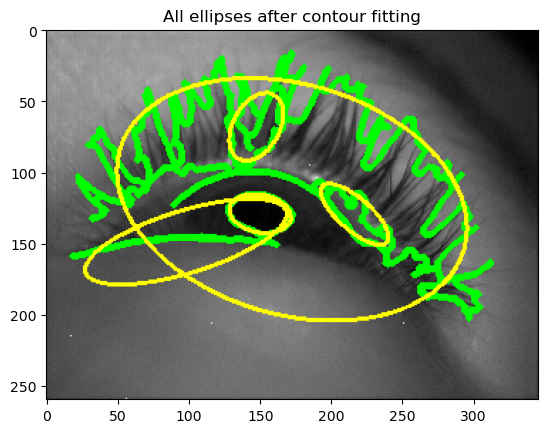

Number of ellipses found: 5
[x, y] = [171, 118]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  171
Ellipse center y coordinate:  118
[x, y] = [96, 148]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  96
Ellipse center y coordinate:  148
[x, y] = [146, 67]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  146
Ellipse center y coordinate:  67
[x, y] = [149, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  149
Ellipse center y coordinate:  128
[x, y] = [215, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  215
Ellipse center y coordinate:  128


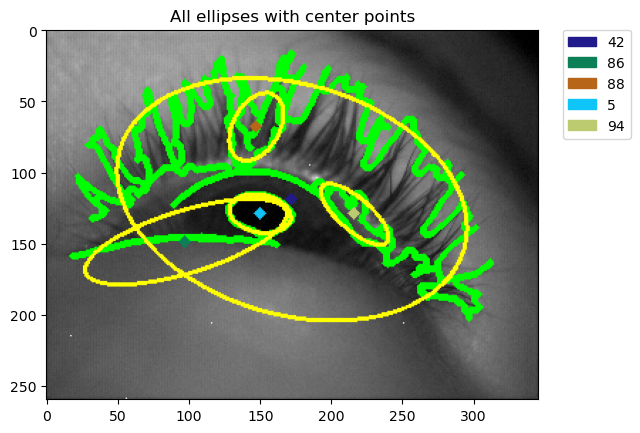

[x, y]: [171, 118]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [96, 148]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [146, 67]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [149, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [215, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 1


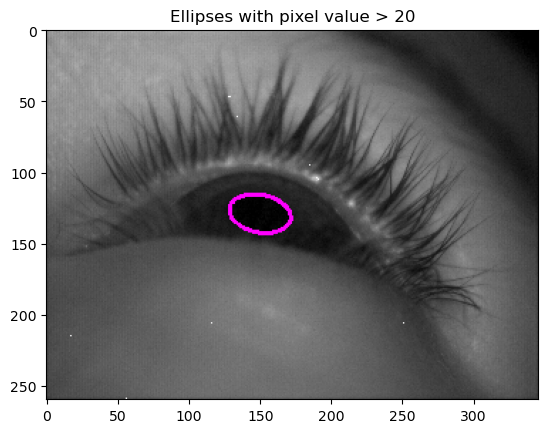

Ellipse with smallest area: ((150.1186065673828, 129.22958374023438), (26.438074111938477, 43.685035705566406), 100.96431732177734)
Area: 3628.376816733808
Center: (150.1186065673828, 129.22958374023438)


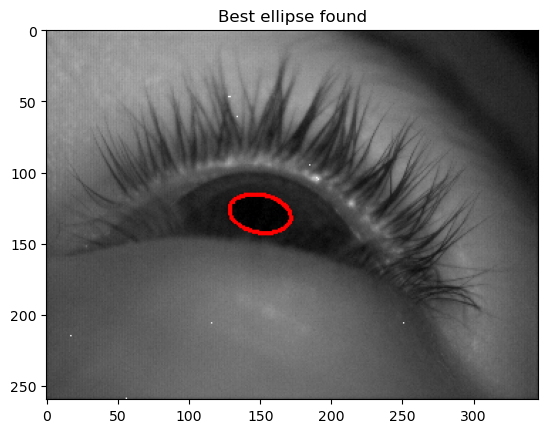

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/2505_618_636_s_443987483.png


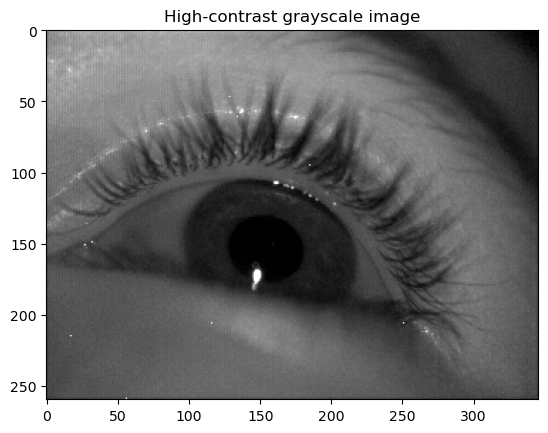

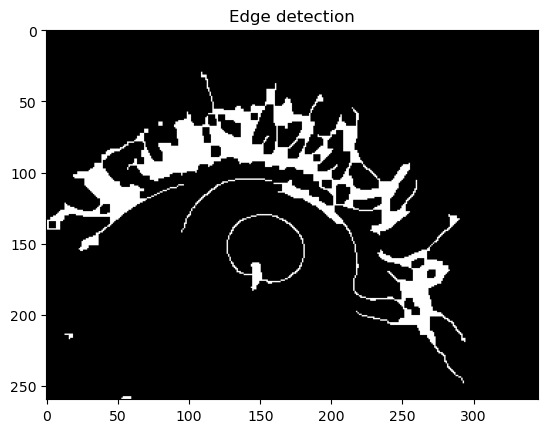

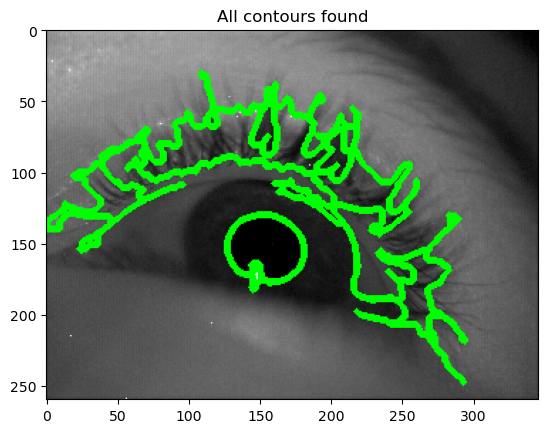

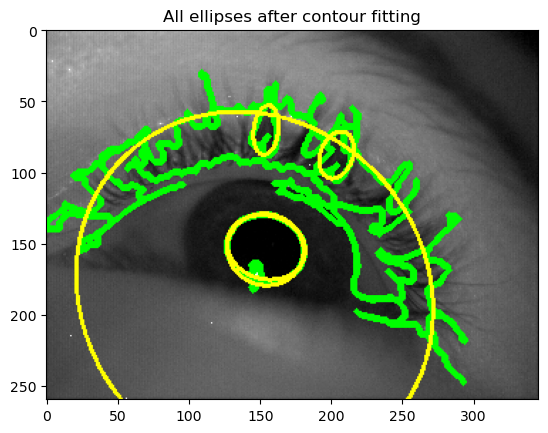

Number of ellipses found: 5
[x, y] = [145, 183]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  145
Ellipse center y coordinate:  183
[x, y] = [152, 153]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  152
Ellipse center y coordinate:  153
[x, y] = [153, 151]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  153
Ellipse center y coordinate:  151
[x, y] = [202, 87]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  202
Ellipse center y coordinate:  87
[x, y] = [153, 69]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  153
Ellipse center y coordinate:  69


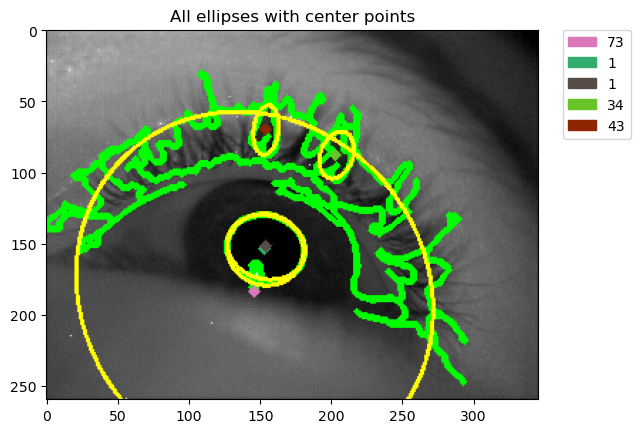

[x, y]: [145, 183]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [152, 153]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [153, 151]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [202, 87]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [153, 69]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 2


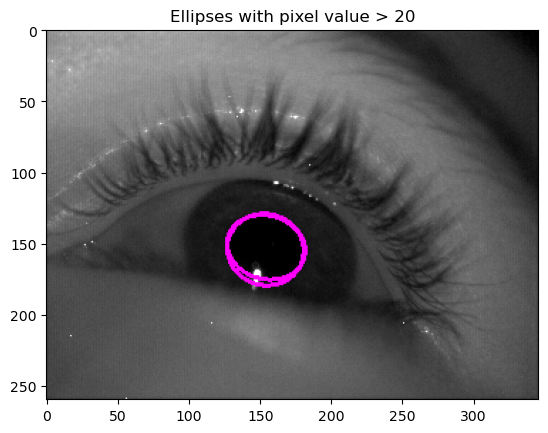

Ellipse with smallest area: ((154.41677856445312, 152.8824005126953), (44.49089813232422, 55.64694595336914), 105.39518737792969)
Area: 7777.900439940443
Center: (154.41677856445312, 152.8824005126953)


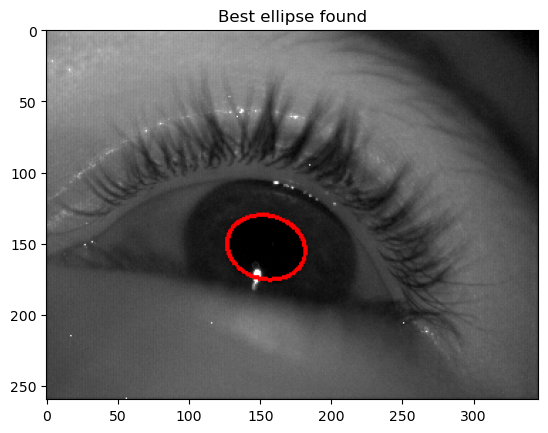

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/3621_228_312_s_488626995.png


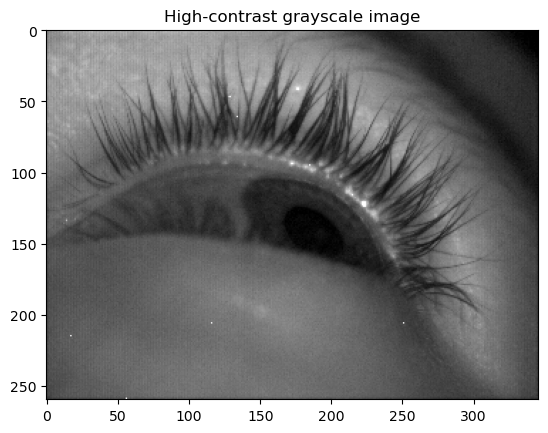

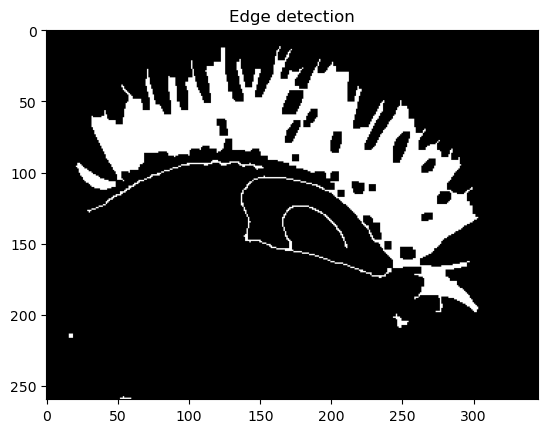

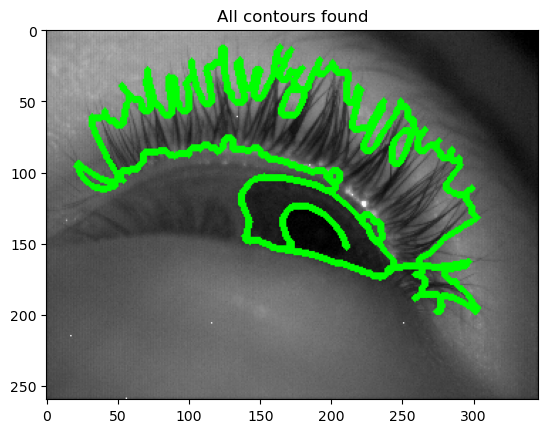

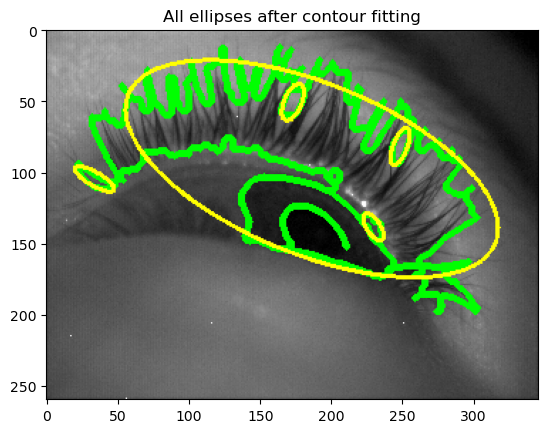

Number of ellipses found: 5
[x, y] = [185, 96]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  185
Ellipse center y coordinate:  96
[x, y] = [172, 49]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  172
Ellipse center y coordinate:  49
[x, y] = [247, 81]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  247
Ellipse center y coordinate:  81
[x, y] = [32, 103]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  32
Ellipse center y coordinate:  103
[x, y] = [228, 137]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  228
Ellipse center y coordinate:  137


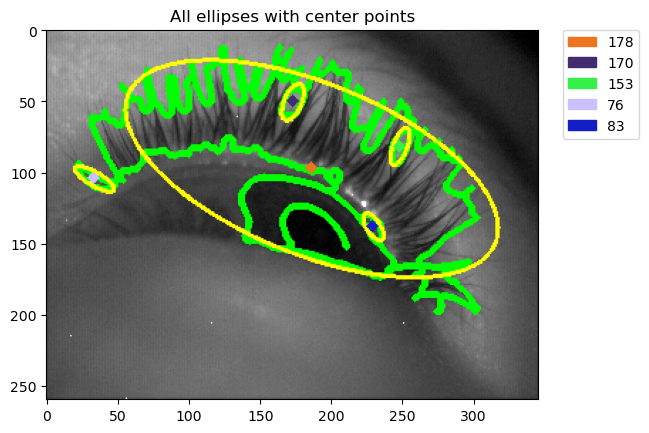

[x, y]: [185, 96]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [172, 49]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [247, 81]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [32, 103]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [228, 137]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 0
Refinement needed... 
Starting pupil detection refinement


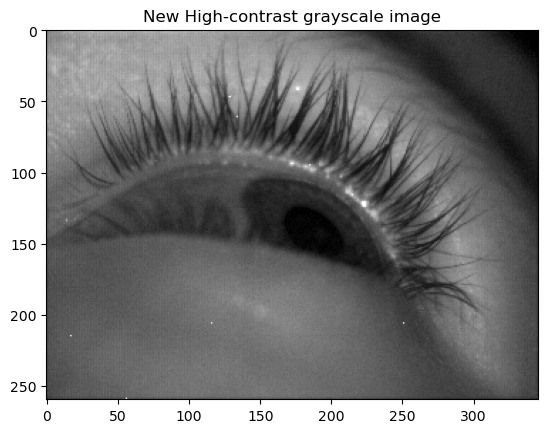

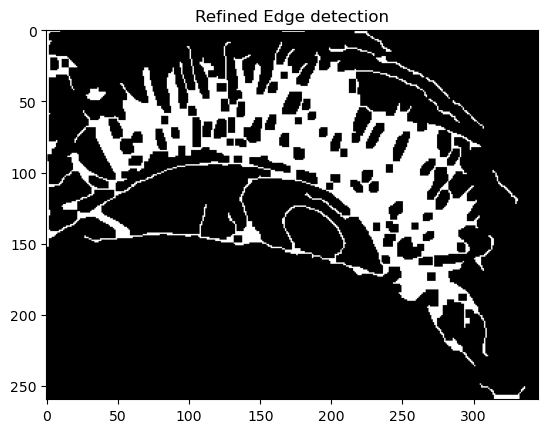

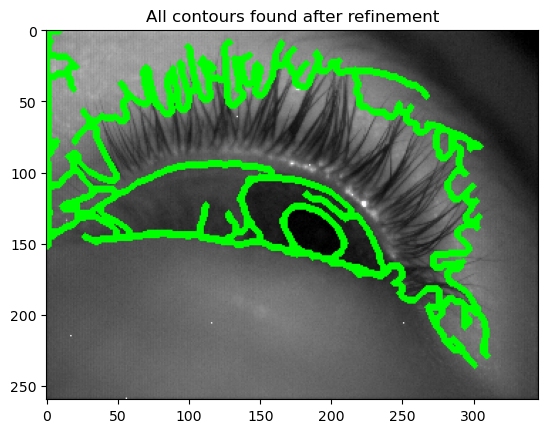

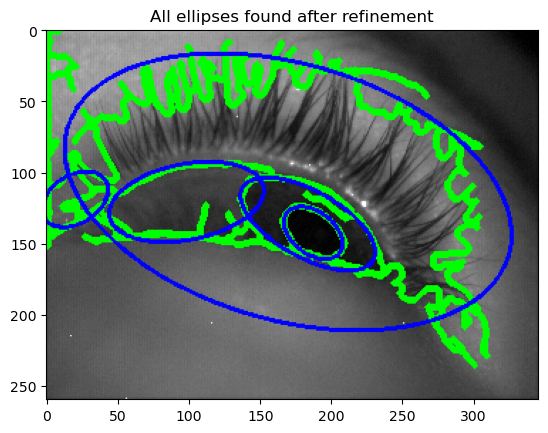

Number of ellipses found after refinement: 5
[x, y] = [168, 112]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  168
Ellipse center y coordinate:  112
[x, y] = [97, 120]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  97
Ellipse center y coordinate:  120
[x, y] = [182, 135]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  182
Ellipse center y coordinate:  135
[x, y] = [186, 141]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  186
Ellipse center y coordinate:  141
[x, y] = [18, 118]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  18
Ellipse center y coordinate:  118


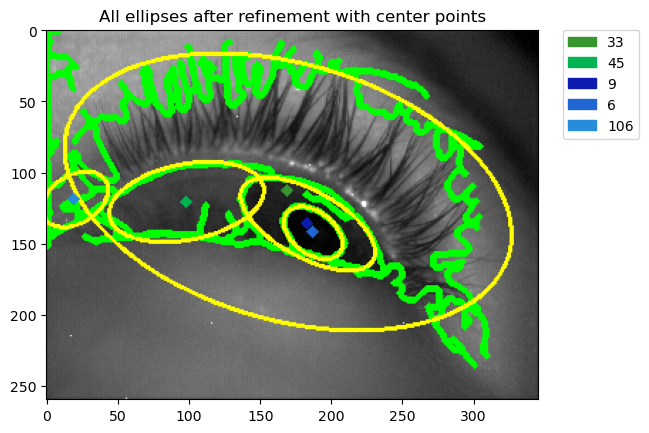

[x, y] = [168, 112]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [97, 120]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [182, 135]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [186, 141]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [18, 118]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses after refinement with pixel value > 20: 2


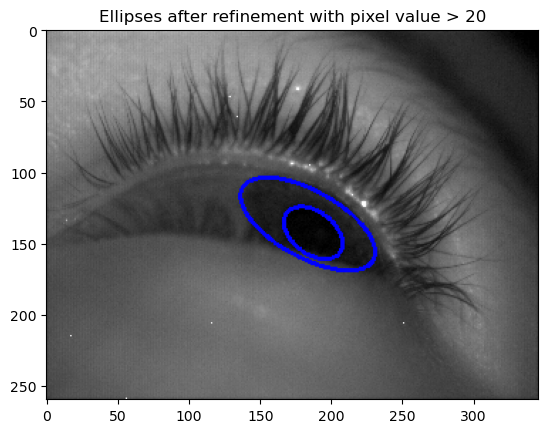

Ellipse with smallest area: ((187.49334716796875, 142.76710510253906), (29.659231185913086, 46.659297943115234), 126.61593627929688)
Area: 4347.583800360534
Center: (187.49334716796875, 142.76710510253906)


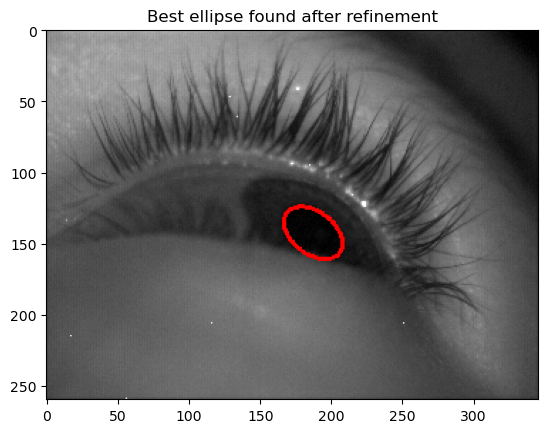

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/1420_306_150_s_400587986.png


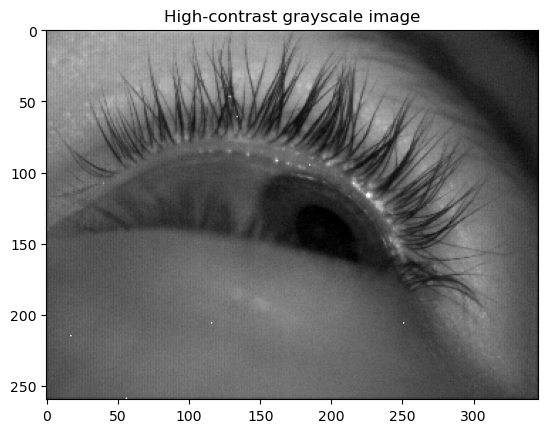

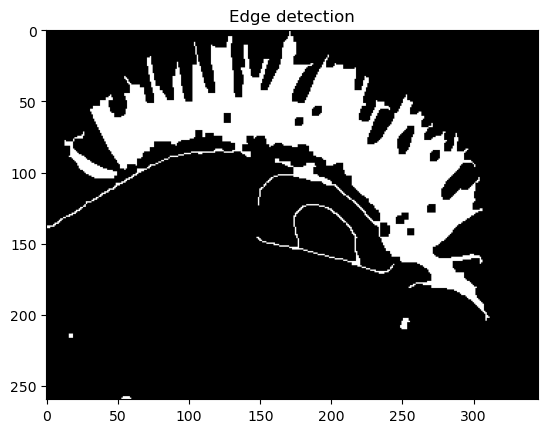

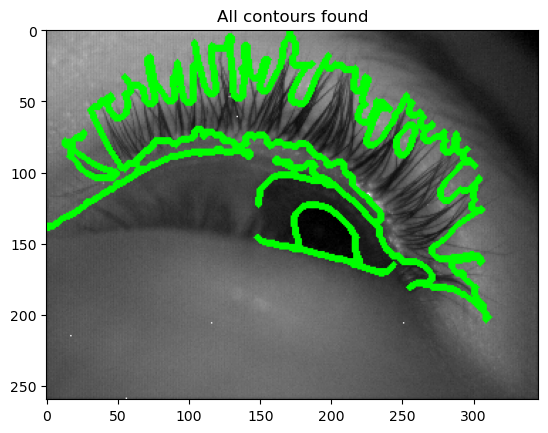

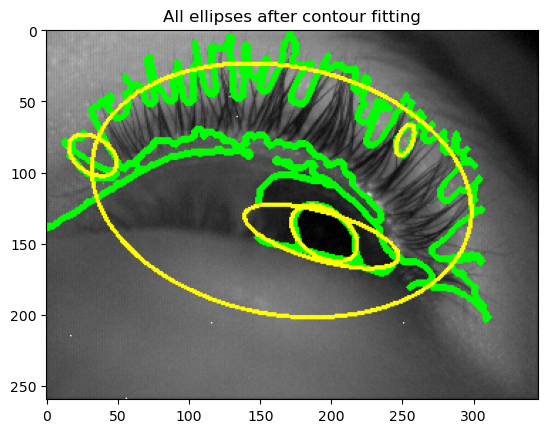

Number of ellipses found: 5
[x, y] = [164, 111]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  164
Ellipse center y coordinate:  111
[x, y] = [192, 144]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  192
Ellipse center y coordinate:  144
[x, y] = [194, 142]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  194
Ellipse center y coordinate:  142
[x, y] = [31, 87]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  31
Ellipse center y coordinate:  87
[x, y] = [251, 76]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  251
Ellipse center y coordinate:  76


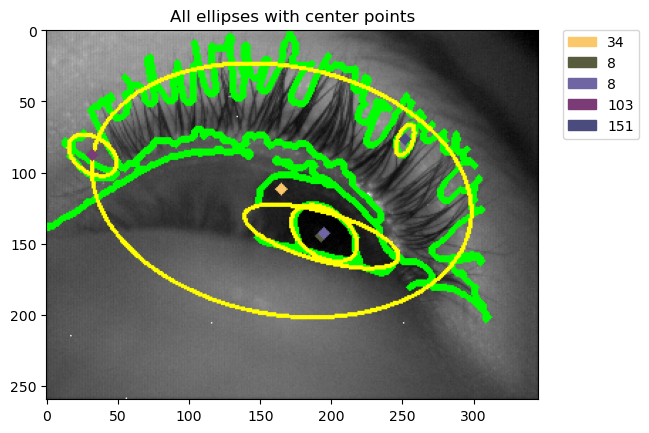

[x, y]: [164, 111]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [192, 144]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [194, 142]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [31, 87]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [251, 76]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 2


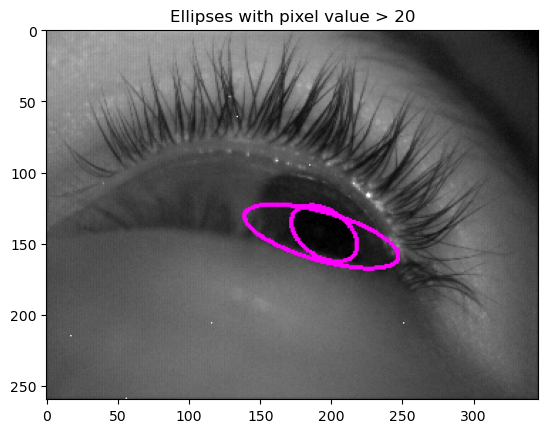

Ellipse with smallest area: ((195.22793579101562, 143.15127563476562), (32.589454650878906, 51.44925308227539), 123.77114868164062)
Area: 5267.518141671179
Center: (195.22793579101562, 143.15127563476562)


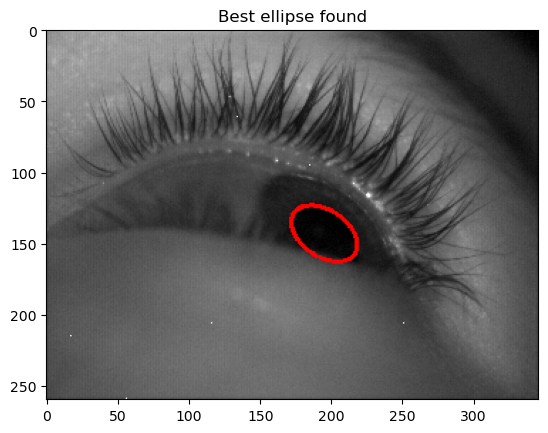

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/6518_600_1748_p_604505772.png


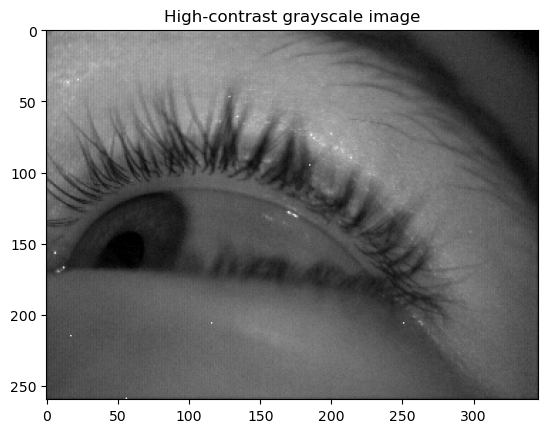

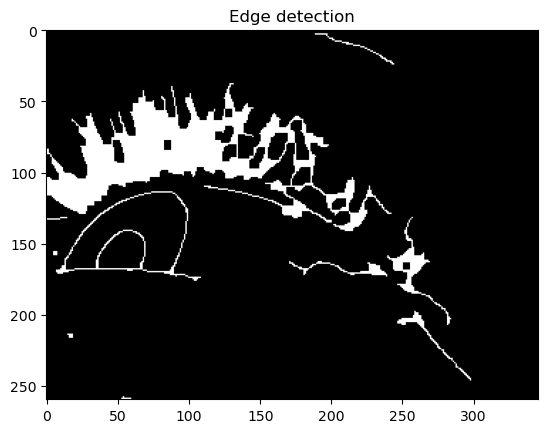

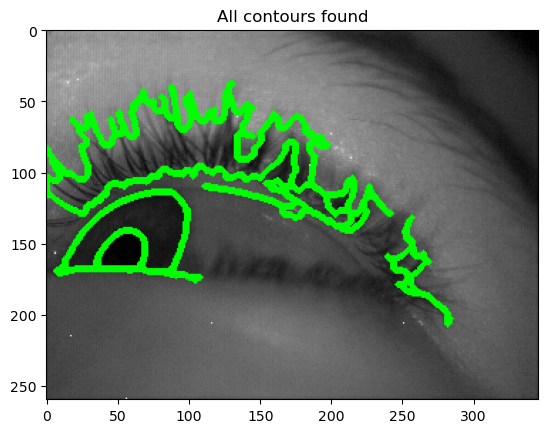

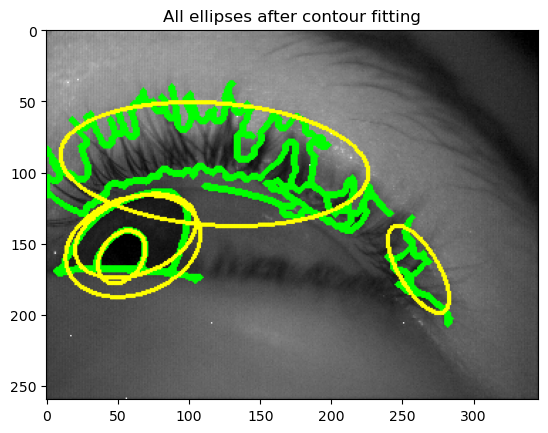

Number of ellipses found: 5
[x, y] = [116, 93]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  116
Ellipse center y coordinate:  93
[x, y] = [59, 151]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  59
Ellipse center y coordinate:  151
[x, y] = [61, 143]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  61
Ellipse center y coordinate:  143
[x, y] = [51, 158]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  51
Ellipse center y coordinate:  158
[x, y] = [260, 167]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  260
Ellipse center y coordinate:  167


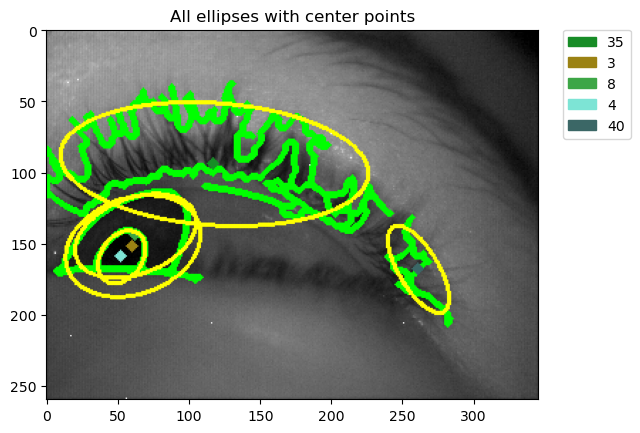

[x, y]: [116, 93]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [59, 151]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [61, 143]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [51, 158]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [260, 167]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 3


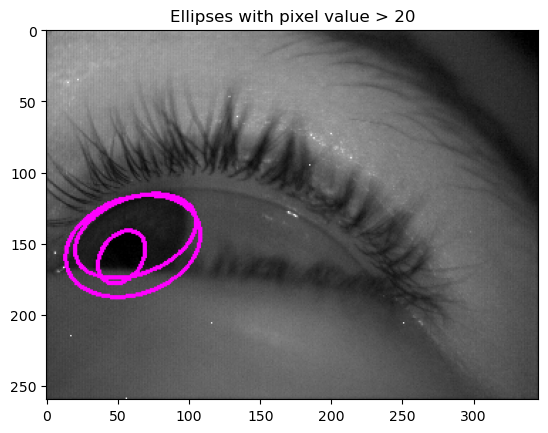

Ellipse with smallest area: ((52.72249984741211, 159.83030700683594), (29.012365341186523, 40.69111251831055), 35.18687438964844)
Area: 3708.792826619631
Center: (52.72249984741211, 159.83030700683594)


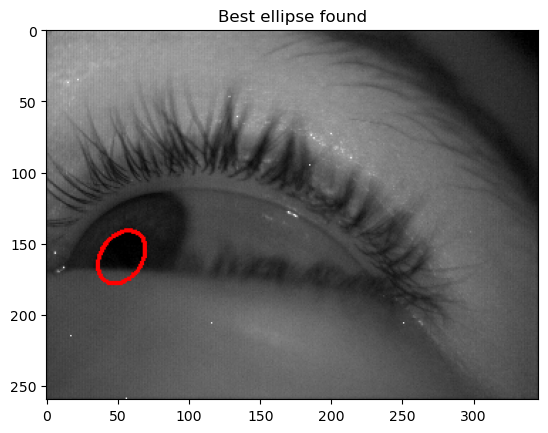

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/7471_900_1000_p_642625348.png


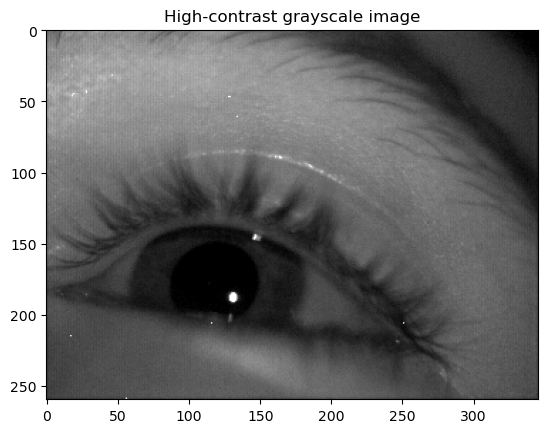

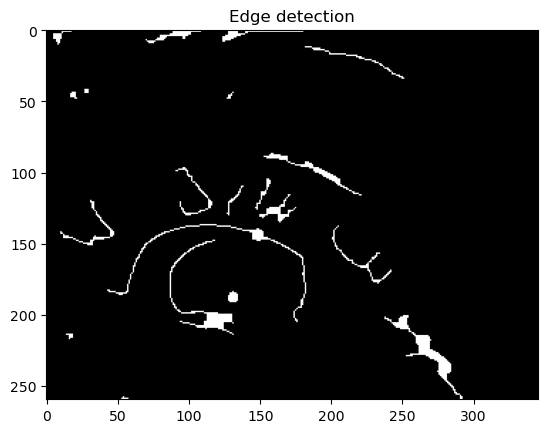

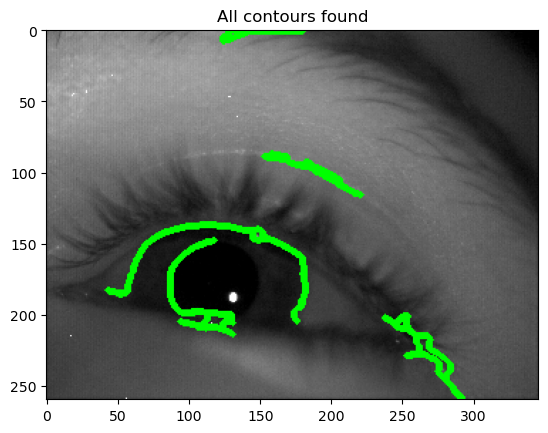

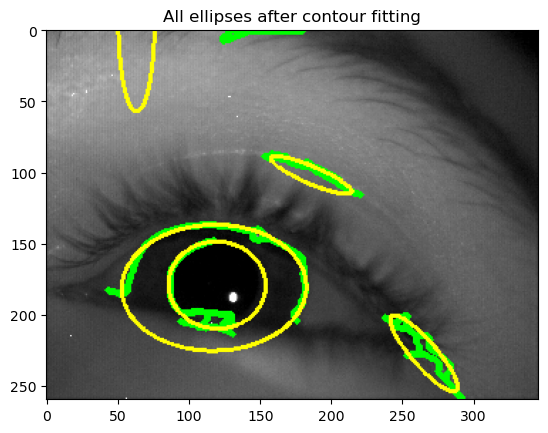

Number of ellipses found: 5
[x, y] = [264, 226]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  264
Ellipse center y coordinate:  226
[x, y] = [118, 178]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  118
Ellipse center y coordinate:  178
[x, y] = [185, 101]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  185
Ellipse center y coordinate:  101
[x, y] = [116, 180]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  116
Ellipse center y coordinate:  180
[x, y] = [62, -8]
x_range:  range(0, 346)
y_range:  range(0, 260)


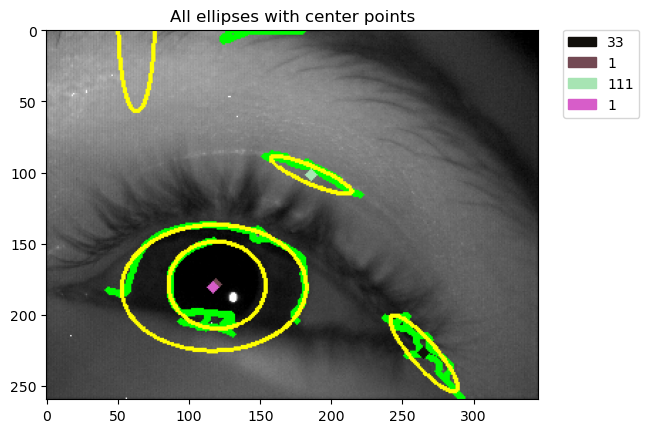

[x, y]: [264, 226]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [118, 178]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [185, 101]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [116, 180]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [62, -8]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 2


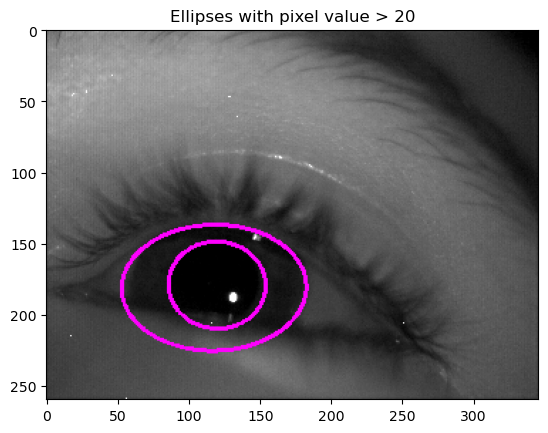

Ellipse with smallest area: ((119.85598754882812, 179.4358673095703), (61.192466735839844, 68.36341857910156), 94.36167907714844)
Area: 13142.306911996237
Center: (119.85598754882812, 179.4358673095703)


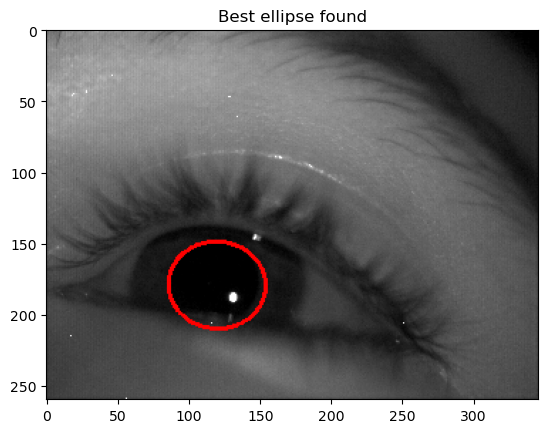

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/439_462_1446_s_361348417.png


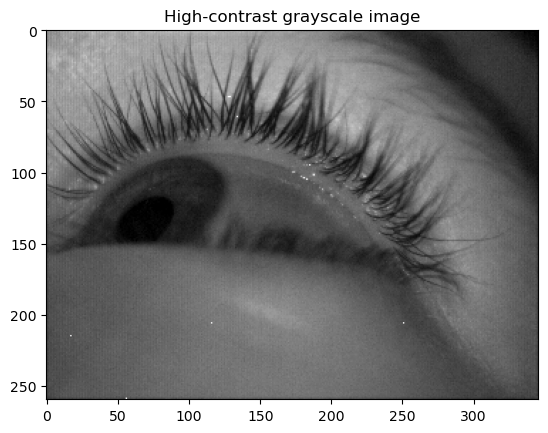

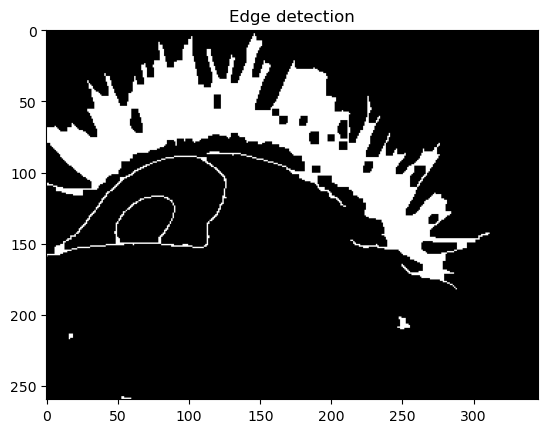

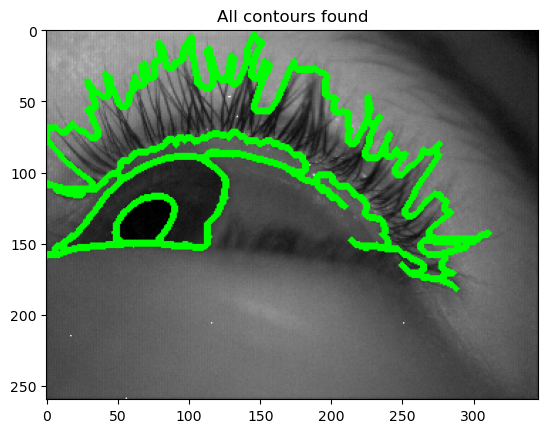

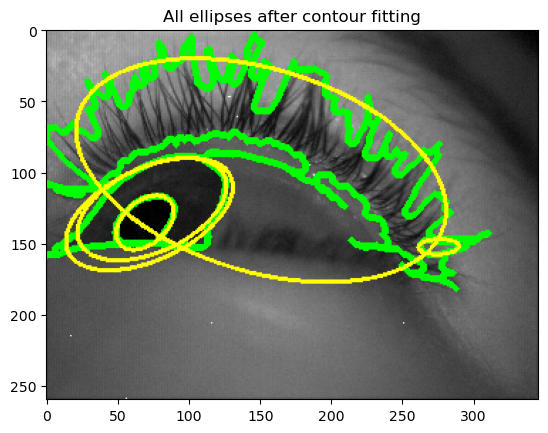

Number of ellipses found: 5
[x, y] = [149, 97]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  149
Ellipse center y coordinate:  97
[x, y] = [71, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  71
Ellipse center y coordinate:  128
[x, y] = [73, 125]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  73
Ellipse center y coordinate:  125
[x, y] = [68, 134]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  68
Ellipse center y coordinate:  134
[x, y] = [274, 151]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  274
Ellipse center y coordinate:  151


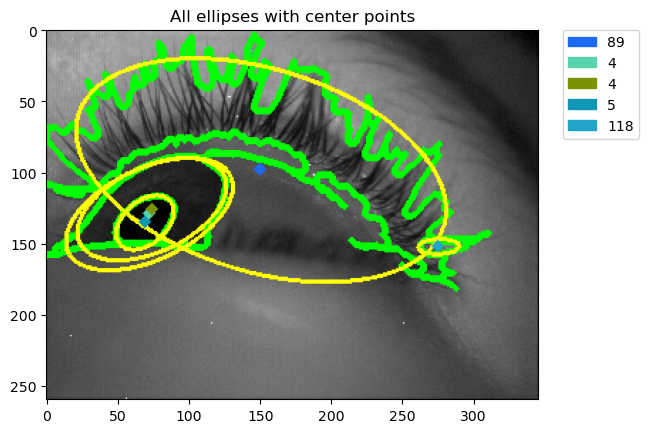

[x, y]: [149, 97]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [71, 128]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [73, 125]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [68, 134]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [274, 151]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 3


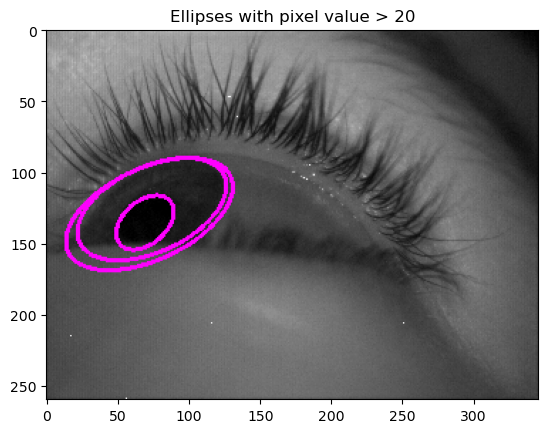

Ellipse with smallest area: ((69.0975570678711, 135.5467071533203), (30.25709342956543, 46.556175231933594), 49.45380783081055)
Area: 4425.418765983549
Center: (69.0975570678711, 135.5467071533203)


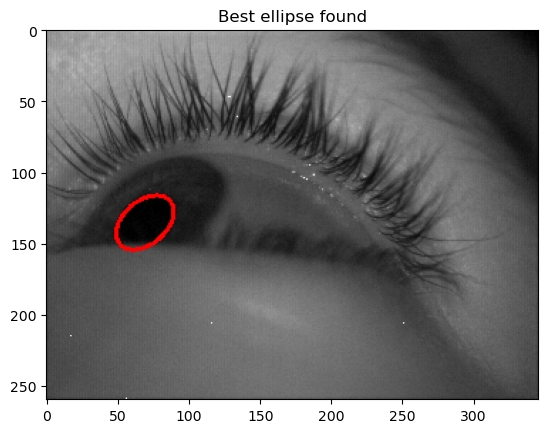

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/6663_600_1106_p_610305705.png


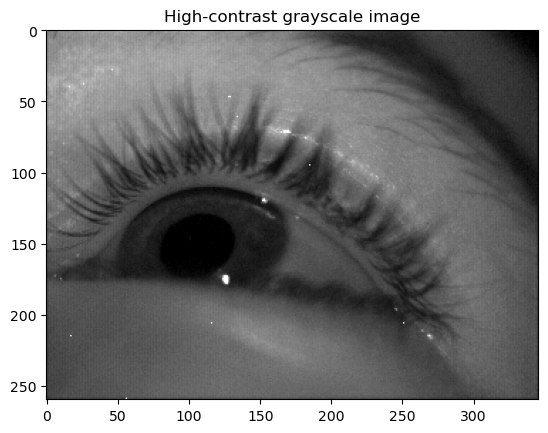

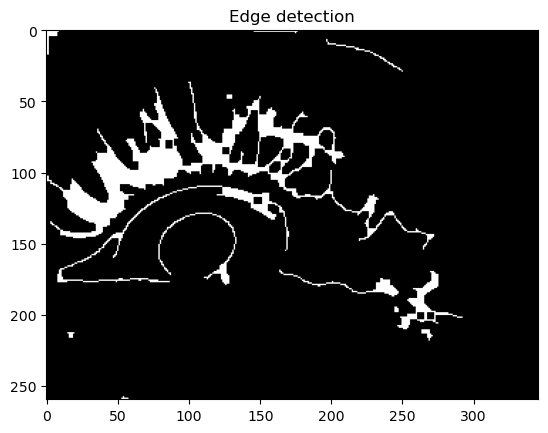

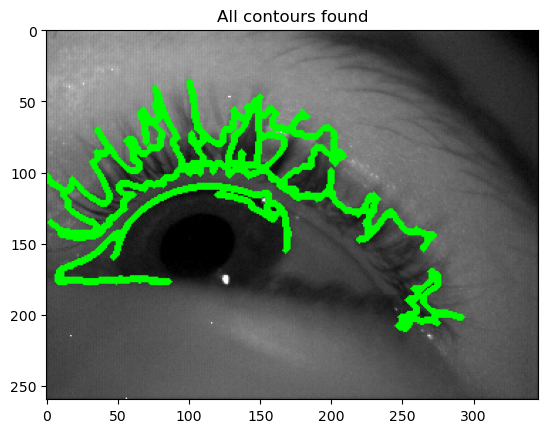

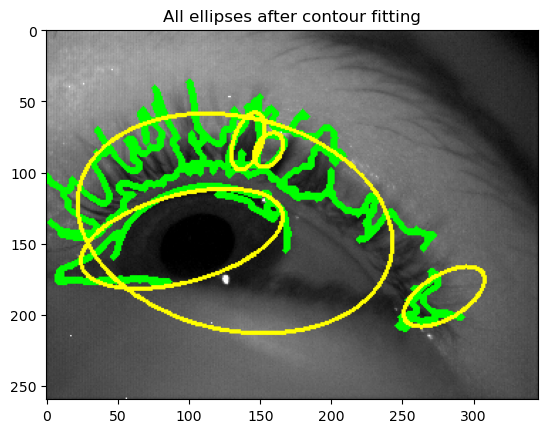

Number of ellipses found: 5
[x, y] = [131, 135]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  131
Ellipse center y coordinate:  135
[x, y] = [140, 77]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  140
Ellipse center y coordinate:  77
[x, y] = [94, 145]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  94
Ellipse center y coordinate:  145
[x, y] = [278, 186]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  278
Ellipse center y coordinate:  186
[x, y] = [155, 83]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  155
Ellipse center y coordinate:  83


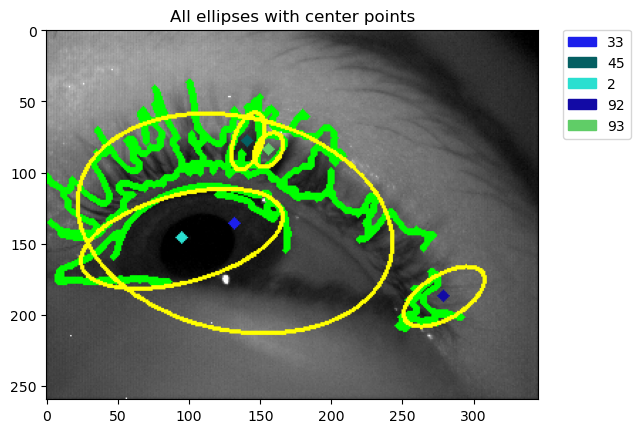

[x, y]: [131, 135]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [140, 77]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [94, 145]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [278, 186]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [155, 83]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 1


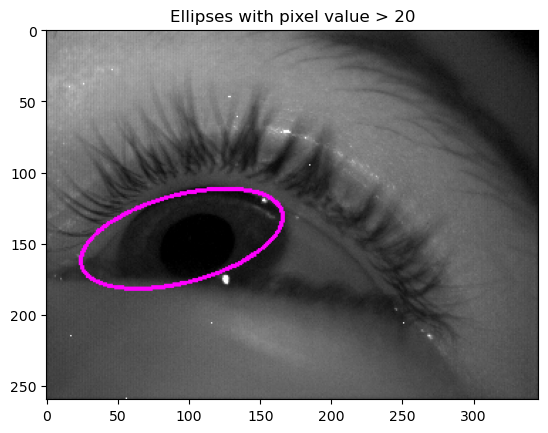

Ellipse with smallest area: ((95.05059814453125, 146.82862854003906), (61.32267379760742, 146.03387451171875), 75.41193389892578)
Area: 28133.551733018372
Center: (95.05059814453125, 146.82862854003906)


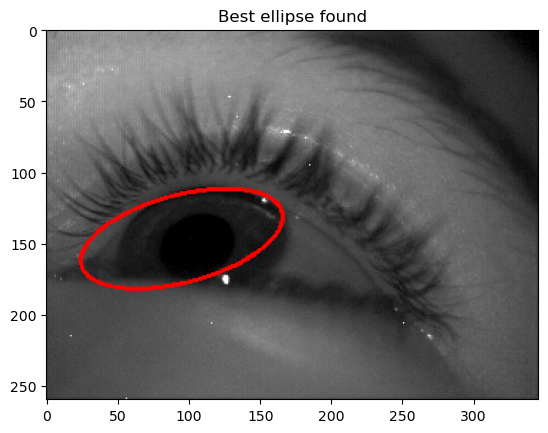

/scratch/vivianep/event_based_gaze_tracking/eye_data/user13/0/frames/387_462_1284_s_359268439.png


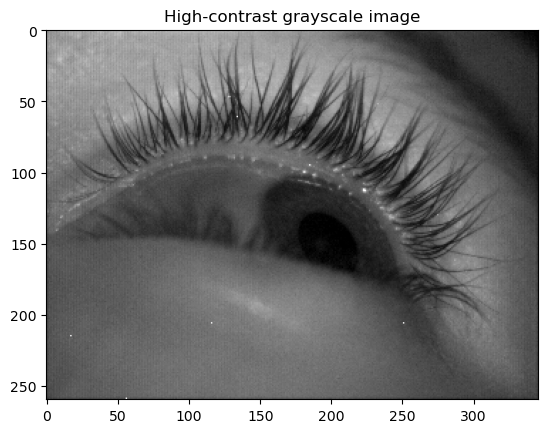

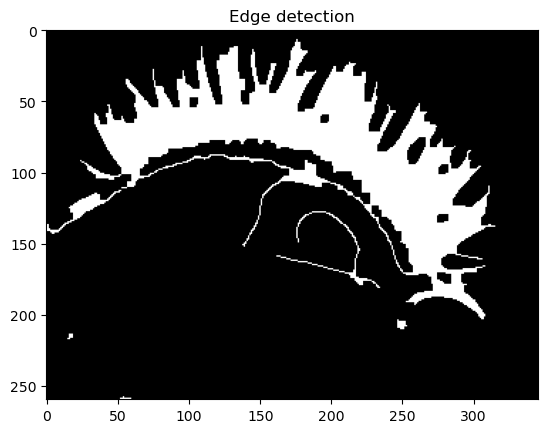

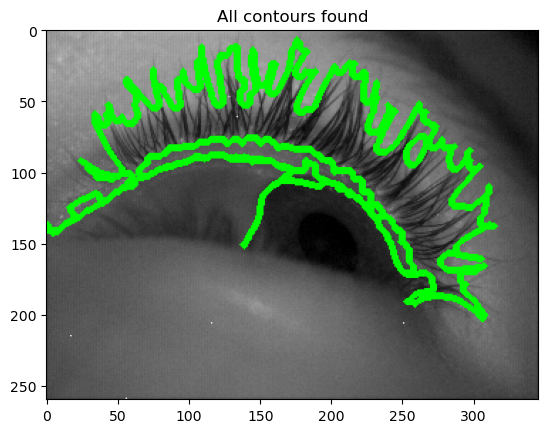

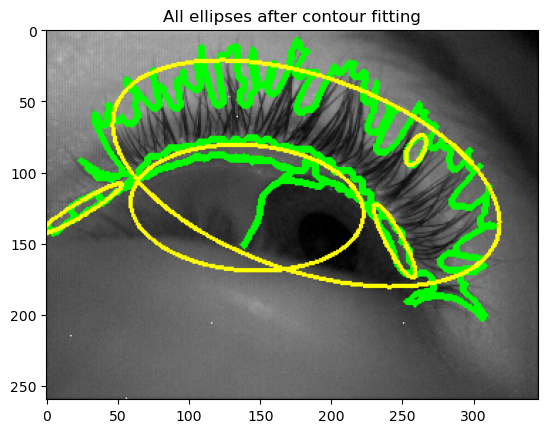

Number of ellipses found: 5
[x, y] = [181, 99]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  181
Ellipse center y coordinate:  99
[x, y] = [139, 124]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  139
Ellipse center y coordinate:  124
[x, y] = [243, 147]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  243
Ellipse center y coordinate:  147
[x, y] = [23, 124]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  23
Ellipse center y coordinate:  124
[x, y] = [258, 83]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  258
Ellipse center y coordinate:  83


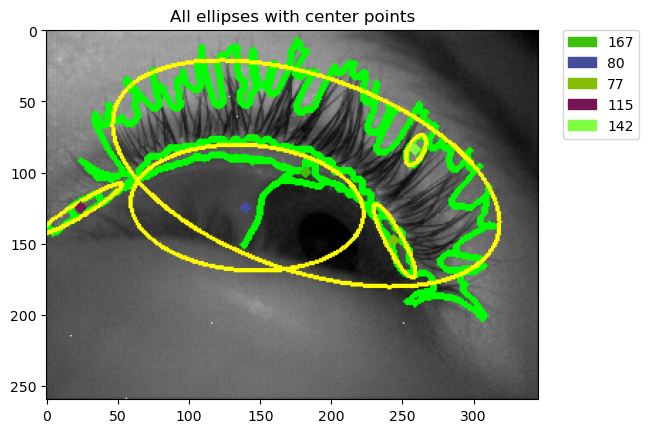

[x, y]: [181, 99]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [139, 124]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [243, 147]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [23, 124]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y]: [258, 83]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses with pixel value > 20: 0
Refinement needed... 
Starting pupil detection refinement


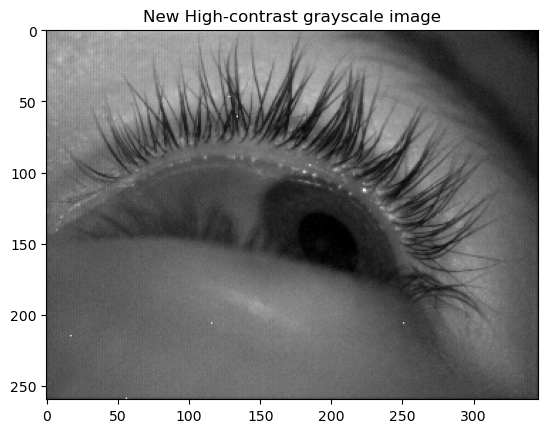

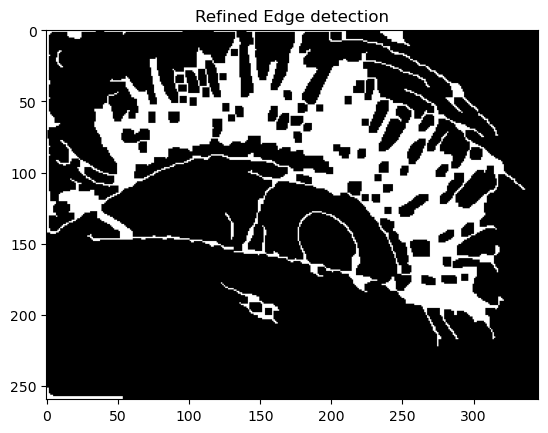

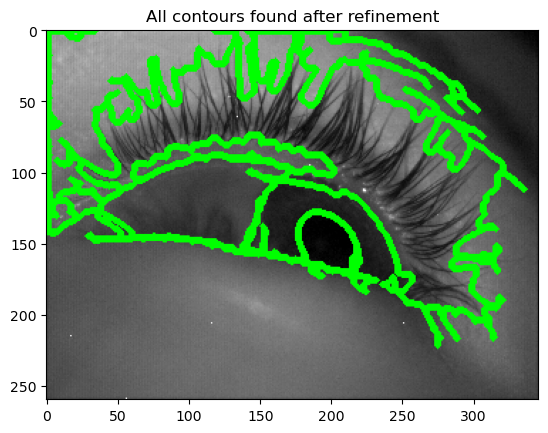

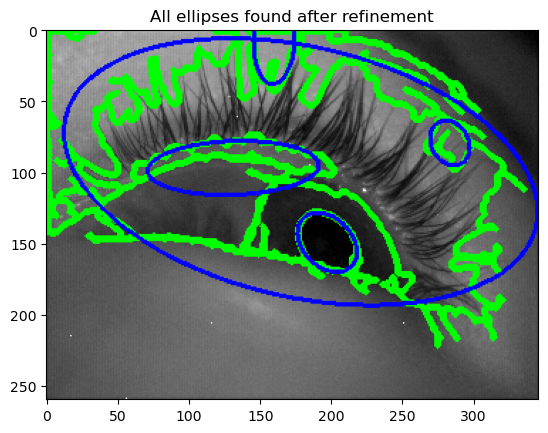

Number of ellipses found after refinement: 5
[x, y] = [177, 98]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  177
Ellipse center y coordinate:  98
[x, y] = [130, 96]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  130
Ellipse center y coordinate:  96
[x, y] = [196, 148]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  196
Ellipse center y coordinate:  148
[x, y] = [159, 6]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  159
Ellipse center y coordinate:  6
[x, y] = [282, 78]
x_range:  range(0, 346)
y_range:  range(0, 260)
Ellipse center x coordinate:  282
Ellipse center y coordinate:  78


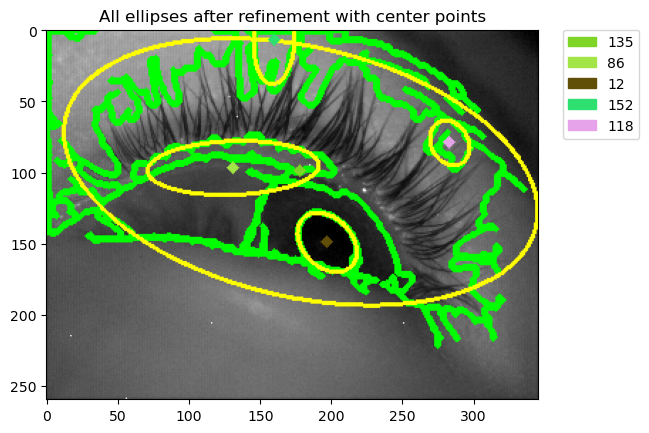

[x, y] = [177, 98]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [130, 96]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [196, 148]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [159, 6]
x_range:  range(0, 346)
y_range:  range(0, 260)
[x, y] = [282, 78]
x_range:  range(0, 346)
y_range:  range(0, 260)
Number of ellipses after refinement with pixel value > 20: 1


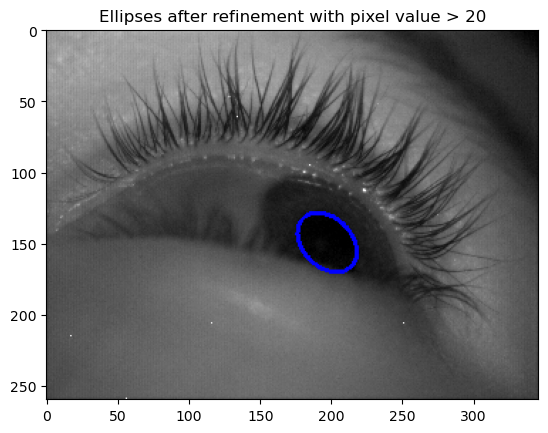

Ellipse with smallest area: ((197.3018341064453, 149.49136352539062), (34.327816009521484, 47.917362213134766), 135.2435302734375)
Area: 5167.6007095938285
Center: (197.3018341064453, 149.49136352539062)


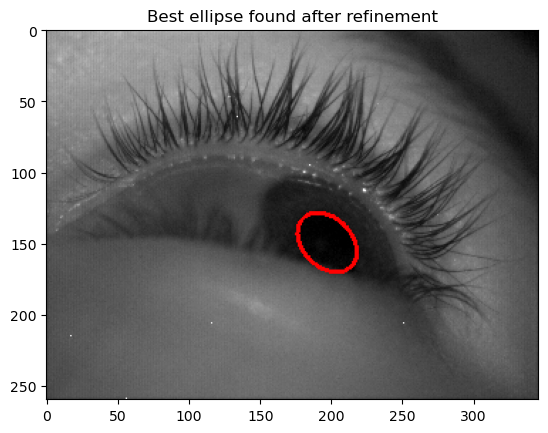

In [377]:
random_frames = random.sample(list(frame_df['img_path']), 10)
for frame in random_frames:
    print(frame)
    pupil_detection(frame, plot=True, best=True, debug=True)

In [373]:
from rich.progress import track

centers = []
num_frames = len(frame_df['img_path'].values)

# enumerate over the frame paths
for i, frame_path in track(enumerate(frame_df['img_path'].values), total=num_frames):
    # detect the pupil in the frame
    pupil = pupil_detection(frame_path, plot=False, best=False, debug=False)
    # append the pupil center coordinates to the centers list
    if pupil is not None:
        centers.append(pupil[0])
    else:
        centers.append(None)




Output()

In [374]:
none_count = 0
for center in centers:
    if center is None:
        none_count += 1

print("Center detection successfull in {}/{} frames".format(len(centers) - none_count, len(centers)))

Center detection successfull in 7099/7664 frames


In [229]:
centers[0]

(214.13980102539062, 197.84889221191406)

In [375]:
# add a new column to the dataframe with the centers
frame_df['pupil'] = centers
frame_df

,row,col,img_path,timestamp,frame_number,pupil
0,930,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650345269,16258,"(220.52920532226562, 202.3928680419922)"
1,928,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650305270,16257,"(173.96734619140625, 183.0572967529297)"
2,928,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650265270,16256,"(221.90208435058594, 200.02102661132812)"
3,922,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650225271,16255,"(215.30715942382812, 200.86318969726562)"
4,916,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650185271,16254,"(171.31689453125, 186.74761962890625)"
...,...,...,...,...,...,...
7659,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343988606,8599,"(125.19098663330078, 115.50032806396484)"
7660,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343948607,8598,"(125.36100006103516, 115.14200592041016)"
7661,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343908607,8597,"(126.70848846435547, 114.09426879882812)"
7662,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343868608,8596,"(125.98942565917969, 114.58133697509766)"


In [379]:
frame_df = pupil_postprocessing(frame_df)

Interpolating 0 missing values in the pupil column...
There are 0 missing values in the pupil column after interpolation.
Removing 33 outliers in the pupil column...


In [380]:
frame_df

,row,col,img_path,timestamp,frame_number,pupil
0,930,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650345269,16258,"(220.52920532226562, 202.3928680419922)"
1,928,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650305270,16257,"(173.96734619140625, 183.0572967529297)"
2,928,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650265270,16256,"(221.90208435058594, 200.02102661132812)"
3,922,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650225271,16255,"(215.30715942382812, 200.86318969726562)"
4,916,150,/scratch/vivianep/event_based_gaze_tracking/ey...,650185271,16254,"(171.31689453125, 186.74761962890625)"
...,...,...,...,...,...,...
7659,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343988606,8599,"(125.19098663330078, 115.50032806396484)"
7660,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343948607,8598,"(125.36100006103516, 115.14200592041016)"
7661,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343908607,8597,"(126.70848846435547, 114.09426879882812)"
7662,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,343868608,8596,"(125.98942565917969, 114.58133697509766)"


In [381]:
event_df['pupil'] = event_df['frame_number'].apply(lambda x: frame_df[frame_df['frame_number'] == x]['pupil'].values[0])

In [ ]:
event_df

In [250]:
# get the indices of the frames with missing pupil centers
missing_indices = frame_df[frame_df['pupil'].isna()].index.values
missing_indices

array([ 695,  699,  715,  724, 1085, 1094, 1096, 1105, 1108, 1109, 1115,
       1116, 1119, 1122, 1131, 1337, 1363, 1820, 1821, 1822, 1824, 1825,
       1826, 1827, 1829, 1831, 1832, 1836, 1837, 1838, 1839, 1840, 1842,
       1843, 1844, 1846, 1848, 1850, 1851, 1852, 1853, 1854, 1855, 1857,
       1858, 1859, 1860, 1861, 1862, 1863, 1864, 1865, 1867, 1868, 1869,
       1870, 1871, 1872, 1874, 1878, 1879, 1882, 1894, 2033, 2130, 2262,
       2920, 2921, 2938, 2940, 2945, 2947, 2986, 3133, 3224, 3225, 3230,
       3231, 3234, 3238, 3239, 3240, 3242, 3243, 3246, 3247, 3451, 3526,
       3757, 3814, 4052, 4259, 4262, 4263, 4266, 4267, 4270, 4272, 4277,
       4285, 4357, 4360, 4361, 4385, 4386, 4388, 4585, 4662, 4678, 4828,
       4835, 4836, 5112, 5117, 5121, 5125, 5128, 5129, 5133, 5668, 5687,
       5688, 5691, 5694, 5696, 6079, 6350, 6354, 6359, 6361, 6362, 6768,
       6778, 6781, 6787, 6788, 6790, 6791, 6868])

In [251]:
frame_df.iloc[missing_indices[0] - 1:missing_indices[0] + 2]

,row,col,img_path,timestamp,frame_number,pupil
694,750,264,/scratch/vivianep/event_based_gaze_tracking/ey...,417194669,10429,"(214.44715881347656, 187.8848876953125)"
695,750,258,/scratch/vivianep/event_based_gaze_tracking/ey...,417154669,10428,None
696,750,252,/scratch/vivianep/event_based_gaze_tracking/ey...,417114670,10427,"(216.11744689941406, 188.13980102539062)"


In [279]:
# add a new column to the dataframe with the centers
frame_df['pupil'] = centers
frame_df.isna().sum()

row               0
col               0
img_path          0
timestamp         0
frame_number      0
pupil           139
dtype: int64

In [288]:
frame_df["pupil"] = frame_df["pupil"].interpolate('time')

In [289]:
frame_df.isna().sum()

row               0
col               0
img_path          0
timestamp         0
frame_number      0
pupil           139
dtype: int64

In [282]:
frame_df["pupil"].interpolate(method="polynomial", order=3).isna().sum()

139

In [286]:
frame_df.iloc[missing_indices[0] - 1:missing_indices[0] + 2]

,row,col,img_path,timestamp,frame_number,pupil
694,750,264,/scratch/vivianep/event_based_gaze_tracking/ey...,417194669,10429,"(214.44715881347656, 187.8848876953125)"
695,750,258,/scratch/vivianep/event_based_gaze_tracking/ey...,417154669,10428,None
696,750,252,/scratch/vivianep/event_based_gaze_tracking/ey...,417114670,10427,"(216.11744689941406, 188.13980102539062)"


In [299]:
# interpolate frame_df.iloc[missing_indices[0] - 1:missing_indices[0] + 2]
frame_df.iloc[missing_indices[0] - 3:missing_indices[0] + 4]["pupil"].interpolate(method="spline", order=2)

692       (213.92138671875, 189.14503479003906)
693      (180.9981689453125, 192.9798583984375)
694     (214.44715881347656, 187.8848876953125)
695                                        None
696    (216.11744689941406, 188.13980102539062)
697    (216.01039123535156, 188.42710876464844)
698    (215.39537048339844, 188.56919860839844)
Name: pupil, dtype: object

In [291]:
frame_df.iloc[missing_indices[0] - 1:missing_indices[0] + 2]["pupil"]

694     (214.44715881347656, 187.8848876953125)
695                                        None
696    (216.11744689941406, 188.13980102539062)
Name: pupil, dtype: object

In [301]:
frame_df['pupil_x'] = frame_df['pupil'].apply(lambda coord: coord[0] if coord is not None else None)
frame_df['pupil_y'] = frame_df['pupil'].apply(lambda coord: coord[1] if coord is not None else None)

frame_df

,row,col,img_path,timestamp,frame_number,pupil,pupil_x,pupil_y
0,932,150,/scratch/vivianep/event_based_gaze_tracking/ey...,444954359,11123,"(214.13980102539062, 197.84889221191406)",214.139801,197.848892
1,932,150,/scratch/vivianep/event_based_gaze_tracking/ey...,444914360,11122,"(218.29869079589844, 199.9582977294922)",218.298691,199.958298
2,928,150,/scratch/vivianep/event_based_gaze_tracking/ey...,444874360,11121,"(221.95411682128906, 193.3547821044922)",221.954117,193.354782
3,924,150,/scratch/vivianep/event_based_gaze_tracking/ey...,444834360,11120,"(207.34556579589844, 203.88690185546875)",207.345566,203.886902
4,918,150,/scratch/vivianep/event_based_gaze_tracking/ey...,444794361,11119,"(218.12757873535156, 199.44345092773438)",218.127579,199.443451
...,...,...,...,...,...,...,...,...
6942,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,167277459,4181,"(179.1407470703125, 149.1064453125)",179.140747,149.106445
6943,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,167237459,4180,"(187.29653930664062, 153.76341247558594)",187.296539,153.763412
6944,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,167197460,4179,"(180.4141845703125, 149.09002685546875)",180.414185,149.090027
6945,0,0,/scratch/vivianep/event_based_gaze_tracking/ey...,167157460,4178,"(180.70846557617188, 148.75148010253906)",180.708466,148.751480


In [302]:
frame_df['pupil_x'].isna().sum()

139

In [303]:
frame_df['pupil_x'].interpolate(method="spline", order=3).isna().sum()

0

In [304]:
frame_df['pupil'].apply(lambda coord: coord[0] if coord is not None else None).values

array([214.13980103, 218.2986908 , 221.95411682, ..., 180.41418457,
       180.70846558, 179.02337646])